
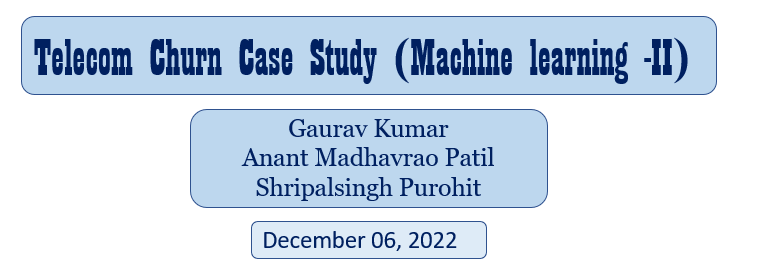








--------------------------------------------------------------------------------

**Business problem**

---



*   In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.
*   So we need to analyse telecom industry data and predict high value customers who are at high risk of churn and identify main indicators of churn

# **Step 1 : Reading and Understanding the Input Data**

**1.1. Importing the Libraries**

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import warnings
warnings.filterwarnings('ignore')

**1.2.  Reading and Understanding the Input Dataset**

In [189]:
pd.set_option('display.max_columns', 500)

In [11]:
#Reading the input datasets on telecom churn
telecom_churn = pd.read_csv('/content/drive/MyDrive/DS study/Colab Notebooks/ML Case Study_II_UpGrad/telecom_churn_data.csv')
telecom_churn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

**1.3.  Inspecting the Dataframe**

In [12]:
# Let's check the dimensions of the dataframe
telecom_churn.shape

(99999, 226)

In [13]:
# let's look at the statistical aspects of the dataframe
telecom_churn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

# **Step 2 : Data Preparation**

**2.1. Checking the data type of each column**

In [14]:
telecom_churn.info(all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    mobile_number             int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    last_date_of_month_9      object 
 9    arpu_6                    float64
 10   arpu_7                    float64
 11   arpu_8                    float64
 12   arpu_9                    float64
 13   onnet_mou_6               float64
 14   onnet_mou_7               float64
 15   onnet_mou_8               float64
 16   onnet_mou_9               float64
 17   offnet_mou_6              float64
 18   offnet_mou_7              float64
 19   offnet_mou_8              float64
 20   offn

**2.2.  Checking the duplicated rows and dropping them off if exists**

In [15]:
telecom_churn.duplicated().sum()

0


> No duplicated values found in the dataset



**2.3. Filtering High-Value Customers**

In [16]:
# Average recharge amount in the first two months by each customer
telecom_churn['avg_recharge_amount_June_&_July']=telecom_churn[['total_rech_amt_6', 'total_rech_amt_7']].mean(axis=1)
telecom_churn['avg_recharge_amount_June_&_July']
telecom_churn.shape

(99999, 227)

In [17]:
#Calculating 70th precentile oof this average recharge amount 
X=np.percentile(telecom_churn['avg_recharge_amount_June_&_July'], 70)
X

368.5

In [18]:
#Filtering high value customers 
telecom_churn_high_value_cust=telecom_churn.loc[telecom_churn['avg_recharge_amount_June_&_July']>=X]
telecom_churn_high_value_cust.shape

(30011, 227)

In [19]:
len(telecom_churn_high_value_cust)

30011



> **telecom_churn_high_value_cust** is the new dataset on which this Data analysis to be done.

> **Churn definition** : To Calculate High value customers

> * Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time. In our analysis we are concentrating on high value customers, as approximately 80% of revenue comes from the top 20% customers. Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

 > * Our dataset is divided into 3 phases:

>        1. Good phase wherein the customer is happy with the service

>        2. Action pase wherein the customer wasn't happy with service or got a better offer from competitor etc. In this phase, the customer usually shows different behaviour than the good phase. Also, it is crucial to identify high-churn-risk customers in this phase, so that some corrective actions can be taken at this point to prevet churn

>        3. Churn phase wherein the customer would have churned

> * High-value customers are those who have recharged with an amount more than or equal to X, where X is the 70th percentile of the average recharge amount in the first two months (the good phase).

> * After identifying high value customers, we will tag churn customers based on those who have not made any calls (either incoming or outgoing) and have not used mobile internet even once in the churn phase.

> * Let's first Identify high Value customers


**2.4.  Deriving New Featurs**

In [20]:
#Tagging churned customers considering the September (month #9) month as churned phase
churned_status = []
for index, row in telecom_churn_high_value_cust.iterrows():
  if row['total_ic_mou_9']==0 or row['total_og_mou_9']==0:
    if row['vol_2g_mb_9']==0 or row['vol_2g_mb_9']==0:
      status = 1
    else:
      status = 0
  else:
    status=0
  churned_status.append(status)
churned_status
telecom_churn_high_value_cust['churned_status']=churned_status

In [ ]:
#Checking the shape of filtered data
telecom_churn_high_value_cust.shape

In [ ]:
#Checking the columns available
telecom_churn_high_value_cust.info(all)

**2.5. Removing the dataset which corresponds to churned customers**

In [24]:
telecom_churn_high_value_cust['churned_status'] = telecom_churn_high_value_cust['churned_status'].astype(int)

In [25]:
#Removing the data which belongs to churn phase (data of September month i.e month #9)
telecom_churn_high_value_cust.drop(['arpu_9','last_date_of_month_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9','std_ic_t2f_mou_9', 'std_ic_t2o_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9', 'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9', 'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9', 'night_pck_user_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'fb_user_9'], axis=1, inplace = True)
telecom_churn_high_value_cust.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_recharge_amount_June_&_July,churned_status
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.00,0.0,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,802,57.74,19.38,18.74,0.0,1185.0,1
8,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.

In [26]:
#Checking the all available columns
telecom_churn_high_value_cust.info(all)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30011 entries, 7 to 99997
Data columns (total 174 columns):
 #    Column                           Dtype  
---   ------                           -----  
 0    mobile_number                    int64  
 1    circle_id                        int64  
 2    loc_og_t2o_mou                   float64
 3    std_og_t2o_mou                   float64
 4    loc_ic_t2o_mou                   float64
 5    last_date_of_month_6             object 
 6    last_date_of_month_7             object 
 7    last_date_of_month_8             object 
 8    arpu_6                           float64
 9    arpu_7                           float64
 10   arpu_8                           float64
 11   onnet_mou_6                      float64
 12   onnet_mou_7                      float64
 13   onnet_mou_8                      float64
 14   offnet_mou_6                     float64
 15   offnet_mou_7                     float64
 16   offnet_mou_8                     float

# **Step 3 : Data Cleaning**

**3.1. Checking the columns having null values**

In [28]:
#Checking the variables having null vallues
telecom_churn_high_value_cust.isnull().sum()

mobile_number                        0
circle_id                            0
loc_og_t2o_mou                     114
std_og_t2o_mou                     114
loc_ic_t2o_mou                     114
                                  ... 
jul_vbc_3g                           0
jun_vbc_3g                           0
sep_vbc_3g                           0
avg_recharge_amount_June_&_July      0
churned_status                       0
Length: 174, dtype: int64

**3.2. Dropping the columns having null values more than the considered threshold**

In [29]:
#Dropping the columns having missing data more than 40 %
#Assumption --> Threshold perecentage of missing data - 40 %
for column in telecom_churn_high_value_cust.columns:
  missing_value_precentage=(pd.isnull(telecom_churn_high_value_cust[(column)]).sum())*100/(len(telecom_churn_high_value_cust.index))
  if missing_value_precentage>40.0:
    telecom_churn_high_value_cust.drop(column, axis=1, inplace=True)
  print(column, ":", missing_value_precentage)

mobile_number : 0.0
circle_id : 0.0
loc_og_t2o_mou : 0.37986071773682983
std_og_t2o_mou : 0.37986071773682983
loc_ic_t2o_mou : 0.37986071773682983
last_date_of_month_6 : 0.0
last_date_of_month_7 : 0.10329545833194495
last_date_of_month_8 : 0.5231415147779148
arpu_6 : 0.0
arpu_7 : 0.0
arpu_8 : 0.0
onnet_mou_6 : 1.0529472526740196
onnet_mou_7 : 1.0096298024057846
onnet_mou_8 : 3.1255206424311086
offnet_mou_6 : 1.0529472526740196
offnet_mou_7 : 1.0096298024057846
offnet_mou_8 : 3.1255206424311086
roam_ic_mou_6 : 1.0529472526740196
roam_ic_mou_7 : 1.0096298024057846
roam_ic_mou_8 : 3.1255206424311086
roam_og_mou_6 : 1.0529472526740196
roam_og_mou_7 : 1.0096298024057846
roam_og_mou_8 : 3.1255206424311086
loc_og_t2t_mou_6 : 1.0529472526740196
loc_og_t2t_mou_7 : 1.0096298024057846
loc_og_t2t_mou_8 : 3.1255206424311086
loc_og_t2m_mou_6 : 1.0529472526740196
loc_og_t2m_mou_7 : 1.0096298024057846
loc_og_t2m_mou_8 : 3.1255206424311086
loc_og_t2f_mou_6 : 1.0529472526740196
loc_og_t2f_mou_7 : 1.0096

In [30]:
#checking the shape of the derived datsets
telecom_churn_high_value_cust.shape

(30011, 144)

**3.3. Cleaning dataset based on the business requirement**

In [31]:
# There are multiple columns which may not be contributing to our final model and unnecessarily, these columns will make the model more complex. Therfore, based on the business requirement and problem statement following listed columns can be dropped off.
#circle_id, loc_og_t2o_mou, std_og_t2o_mou, loc_ic_t2o_mou, last_date_of_month_6, last_date_of_month_7, last_date_of_month_8, spl_og_mou_6, spl_og_mou_7, spl_og_mou_8, og_others_6, og_others_7, og_others_8, spl_ic_mou_6, spl_ic_mou_7, spl_ic_mou_8, ic_others_6, ic_others_7, ic_others_8, vol_2g_mb_6, vol_2g_mb_7, vol_2g_mb_8, monthly_2g_6, monthly_2g_7, monthly_2g_8, sachet_2g_6, sachet_2g_7, sachet_2g_8
telecom_churn_high_value_cust.drop(['circle_id','loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'ic_others_6', 'ic_others_7', 'ic_others_8', 'vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_7', 'sachet_2g_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'], axis=1, inplace = True)

In [32]:
#checking the shape of the derived datsets
telecom_churn_high_value_cust.shape

(30011, 110)

In [33]:
#Looking at the missing value precentage of columns, they are lesser than 1%. Therefore, Data imputation for rows having missing data for these columns is not required and these respective rows can be deleted.
telecom_churn_high_value_cust.dropna (inplace= True)

In [34]:
#Checking the missing value precentage in each column
for column in telecom_churn_high_value_cust.columns:
  missing_value_precentage=(pd.isnull(telecom_churn_high_value_cust[(column)]).sum())*100/(len(telecom_churn_high_value_cust.index))
  print(column, ":",missing_value_precentage)

mobile_number : 0.0
arpu_6 : 0.0
arpu_7 : 0.0
arpu_8 : 0.0
onnet_mou_6 : 0.0
onnet_mou_7 : 0.0
onnet_mou_8 : 0.0
offnet_mou_6 : 0.0
offnet_mou_7 : 0.0
offnet_mou_8 : 0.0
roam_ic_mou_6 : 0.0
roam_ic_mou_7 : 0.0
roam_ic_mou_8 : 0.0
roam_og_mou_6 : 0.0
roam_og_mou_7 : 0.0
roam_og_mou_8 : 0.0
loc_og_t2t_mou_6 : 0.0
loc_og_t2t_mou_7 : 0.0
loc_og_t2t_mou_8 : 0.0
loc_og_t2m_mou_6 : 0.0
loc_og_t2m_mou_7 : 0.0
loc_og_t2m_mou_8 : 0.0
loc_og_t2f_mou_6 : 0.0
loc_og_t2f_mou_7 : 0.0
loc_og_t2f_mou_8 : 0.0
loc_og_t2c_mou_6 : 0.0
loc_og_t2c_mou_7 : 0.0
loc_og_t2c_mou_8 : 0.0
loc_og_mou_6 : 0.0
loc_og_mou_7 : 0.0
loc_og_mou_8 : 0.0
std_og_t2t_mou_6 : 0.0
std_og_t2t_mou_7 : 0.0
std_og_t2t_mou_8 : 0.0
std_og_t2m_mou_6 : 0.0
std_og_t2m_mou_7 : 0.0
std_og_t2m_mou_8 : 0.0
std_og_t2f_mou_6 : 0.0
std_og_t2f_mou_7 : 0.0
std_og_t2f_mou_8 : 0.0
std_og_mou_6 : 0.0
std_og_mou_7 : 0.0
std_og_mou_8 : 0.0
isd_og_mou_6 : 0.0
isd_og_mou_7 : 0.0
isd_og_mou_8 : 0.0
total_og_mou_6 : 0.0
total_og_mou_7 : 0.0
total_og_mou_8

In [35]:
# Checking the shape of the derived datsets
telecom_churn_high_value_cust.shape

(28487, 110)

**Observations;**


---


  1. As we can see 30 numbers of columns have been dropped of because of their higher missing values (equal to or more than 40%) and other 38 columns have been dropped off based on business requirement. As consequence of that, now the derived dataset has 107 columns.

  2. Since, missing value precentage of rest columns were less than 1%, the corresponding rows have been deleted. A consequence of that, now the derived datset has 26463 rows.


**3.4. Deriving New Features**

In [36]:
# Deriving new variable based on the data of month #6, #7, and #8 - I

# Checking whether customers prefers using voice calls onnnet or offnet - Month #6 (June)
# Assigning value 1 for onnet and 0 for offnet  
mou_6_new=[]
for index, row in telecom_churn_high_value_cust.iterrows():
  if row['onnet_mou_6'] > row['offnet_mou_6']:
    status = 1
  else:
    status = 0
  mou_6_new.append(status)
mou_6_new
telecom_churn_high_value_cust['mou_6_new']=mou_6_new
telecom_churn_high_value_cust['mou_6_new']

7        0
8        1
13       1
16       0
17       1
        ..
99970    0
99974    0
99986    1
99988    1
99997    0
Name: mou_6_new, Length: 28487, dtype: int64

In [37]:
# Deriving new variable based on the data of month #6, #7, and #8 - II

# Checking whether customers prefers using voice calls onnnet or offnet - Month #7 (July)
# Assigning value 1 for onnet and 0 for offnet  
mou_7_new=[]
for index, row in telecom_churn_high_value_cust.iterrows():
  if row['onnet_mou_7'] > row['offnet_mou_7']:
    status = 1
  else:
    status = 0
  mou_7_new.append(status)
mou_7_new
telecom_churn_high_value_cust['mou_7_new']=mou_7_new
telecom_churn_high_value_cust['mou_7_new']

7        0
8        1
13       0
16       0
17       1
        ..
99970    0
99974    0
99986    0
99988    0
99997    0
Name: mou_7_new, Length: 28487, dtype: int64

In [38]:
# Deriving new variable based on the data of month #6, #7, and #8 - III

# Checking whether customers prefers using voice calls onnnet or offnet - Month #8 (August)
# Assigning value 1 for onnet and 0 for offnet  
mou_8_new=[]
for index, row in telecom_churn_high_value_cust.iterrows():
  if row['onnet_mou_8'] > row['offnet_mou_8']:
    status = 1
  else:
    status = 0
  mou_8_new.append(status)
mou_8_new
telecom_churn_high_value_cust['mou_8_new']=mou_8_new
telecom_churn_high_value_cust['mou_8_new']

7        0
8        0
13       1
16       0
17       1
        ..
99970    0
99974    0
99986    1
99988    0
99997    0
Name: mou_8_new, Length: 28487, dtype: int64

# **Step 4 : Data Preparation**

**4.1. Exploratory Data Analysis**


---


As first step towards data analysis and model building, we understood the dataset given and derived a new dataset based on the business requirement.Then, we moved forward towards cleaning the dataset and derived a new datset having 121 total number of columns and 26463 tatal number rows. In this step of data analysis, We will further deep dive into the derived datset *telecom_churn_high_value_cust* and try to visualize the variables and understand the relation of one-another. 

> **4.1.1. Data Visualization - Univariate Analyis**



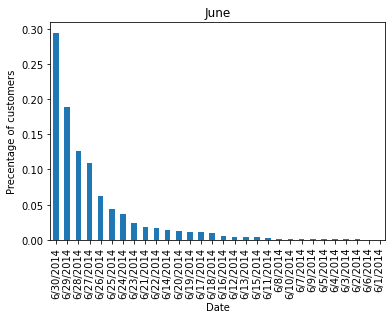

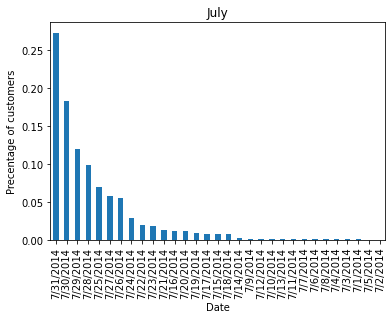

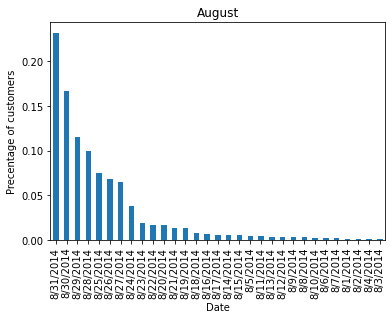

In [39]:
# Let's find out what is the trend of doing recharge in June month
telecom_churn_high_value_cust.date_of_last_rech_6.value_counts(normalize=True).plot.bar(title = 'June', xlabel = 'Date', ylabel = 'Precentage of customers')
plt.show()
# Let's find out what is the trend of doing recharge in July month
telecom_churn_high_value_cust.date_of_last_rech_7.value_counts(normalize=True).plot.bar(title = 'July', xlabel = 'Date', ylabel = 'Precentage of customers')
plt.show()
# Let's find out what is the trend of doing recharge in August month
telecom_churn_high_value_cust.date_of_last_rech_8.value_counts(normalize=True).plot.bar(title = 'August', xlabel = 'Date', ylabel = 'Precentage of customers')
plt.show()

**Observation;**


---


From the above visualization it is clear that majority of customers around 85% have done their recharge towards end of the month


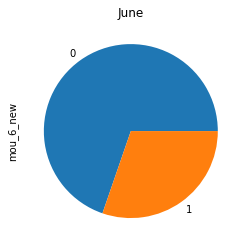

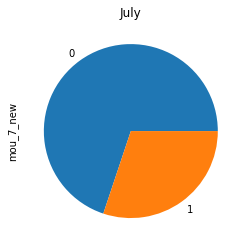

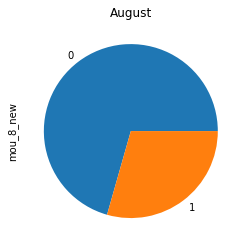

In [40]:
# Let's Check the ratio of customers using onnet and offnet services in June
telecom_churn_high_value_cust.mou_6_new.value_counts(normalize=True).plot.pie(title = 'June')
plt.show()
# Let's Check the ratio of customers using onnet and offnet services in July
telecom_churn_high_value_cust.mou_7_new.value_counts(normalize=True).plot.pie(title = 'July')
plt.show()
# Let's Check the ratio of customers using onnet and offnet services in August
telecom_churn_high_value_cust.mou_8_new.value_counts(normalize=True).plot.pie(title = 'August')
plt.show()

**Observation;**

---


From the above visualizations it is clear that majority of customers are using offnet services around 75% every month consistently.

> **4.1.2. Data Visualization - Bivariate Analyis**



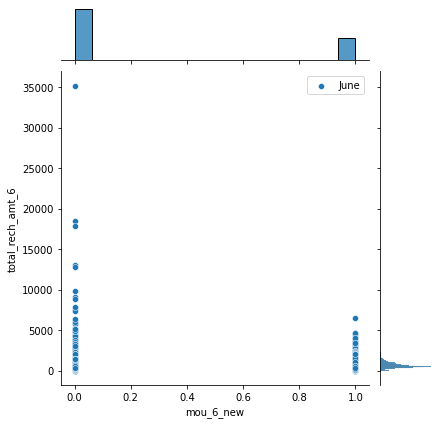

In [41]:
# Let's understand which type of voice services is genrating more revenue between onnet services and offnet services - June
sns.jointplot(x = telecom_churn_high_value_cust['mou_6_new'], y  = telecom_churn_high_value_cust['total_rech_amt_6'], label = 'June')
plt.show()

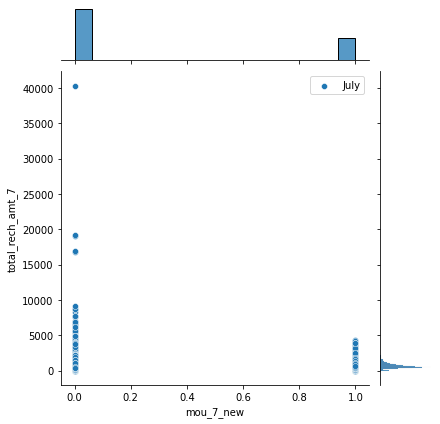

In [42]:
# Let's understand which type of voice services is genrating more revenue between onnet services and offnet services - July
sns.jointplot(x = telecom_churn_high_value_cust['mou_7_new'], y  = telecom_churn_high_value_cust['total_rech_amt_7'], label = 'July')
plt.show()

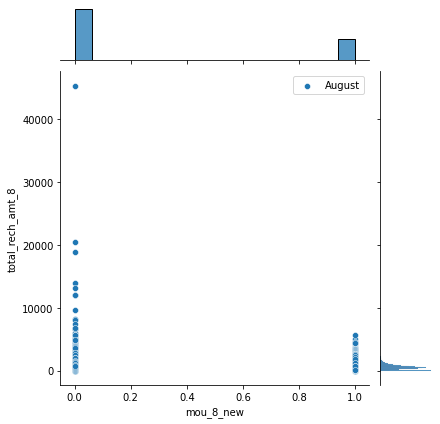

In [43]:
# Let's understand which type of voice services is genrating more revenue between onnet services and offnet services - August
sns.jointplot(x = telecom_churn_high_value_cust['mou_8_new'], y  = telecom_churn_high_value_cust['total_rech_amt_8'], label = 'August')
plt.show()

**Observation;**

---



From the above visualizations it is clear that majority of recharges are done for offnet services every month consistently.


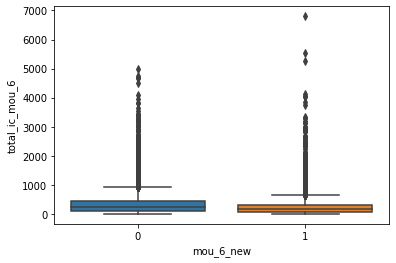

In [44]:
# Let's understand the major type of voice calls which customers are using on incoming calls in the month of June
sns.boxplot(x = telecom_churn_high_value_cust['mou_6_new'], y  = telecom_churn_high_value_cust['total_ic_mou_6'])
plt.show()

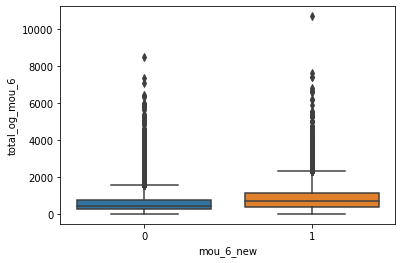

In [45]:
# Let's understand the major type of voice calls which customers are using on outgoing calls in the month of June
sns.boxplot(x = telecom_churn_high_value_cust['mou_6_new'], y  = telecom_churn_high_value_cust['total_og_mou_6'])
plt.show()

**Observation;**


---


From the above visualizations, it is clear that majority of customers use offnet services to attend incoming calls and onnet services to make outgoing calls.

**4.2. Checking Correlation Metrics**

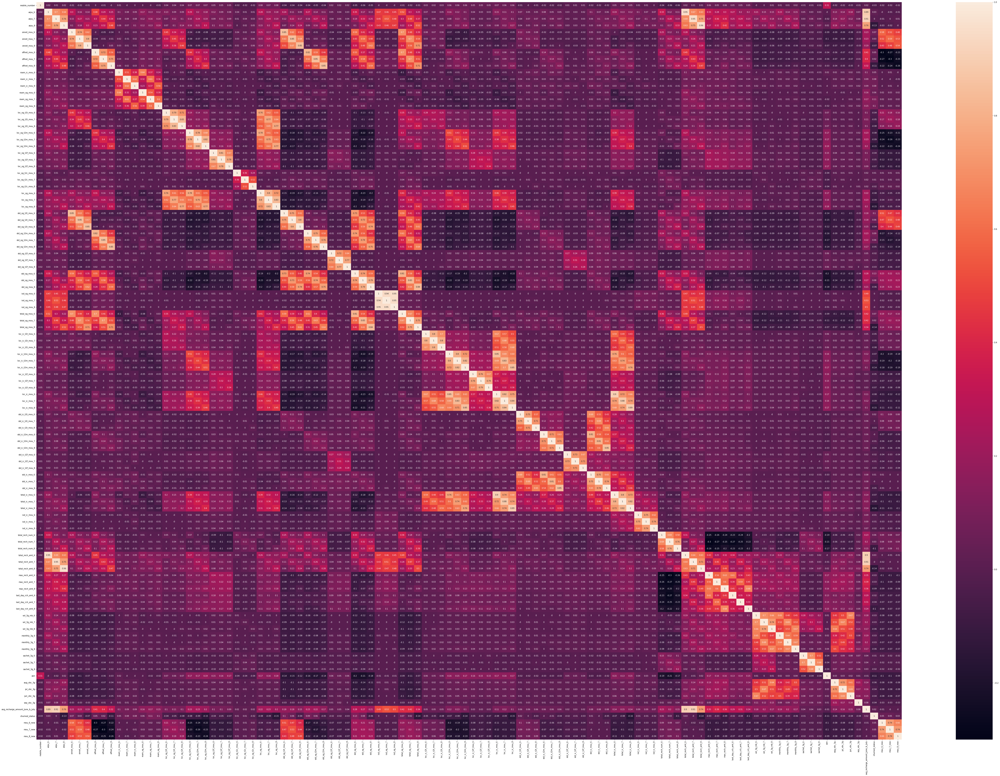

In [46]:
# Let's see the correlation matrix for all these variables
plt.figure(figsize = (100,70))        # Size of the figure
sns.heatmap(round(telecom_churn_high_value_cust.corr(), 2),annot = True)
plt.show()

**4.3. Removing columns which are highly correlated to one another in the derived datset**


In [47]:
# Based on the correlation matrix, there are multiple variables which are highly correlated. Therefore these highly co-related columns can be deleted.
# After carefully observing the correlation matrix, there are 74 number of columns which are highly corelated with one another. cutoff corelation coeffictient assumed is 0.6.
# Below is the list of colmuns whhich can be dropped off the dataset.
# arpu_7, arpu_8, total_rech_num_6, total_rech_num_7, total_rech_num_8, onnet_mou_7, onnet_mou_8, std_og_t2t_mou_6, std_og_t2t_mou_7,
# std_og_t2t_mou_8, std_og_mou_6, std_og_mou_7, std_og_mou_8, total_og_mou_6, total_og_mou_7, total_og_mou_8, offnet_mou_7, offnet_mou_8,
# std_og_t2m_mou_6, std_og_t2m_mou_7, std_og_t2m_mou_8, loc_og_t2t_mou_7, loc_og_t2t_mou_8, loc_og_mou_6, loc_og_mou_7, loc_og_mou_8, 
# loc_og_t2m_mou_7, loc_og_t2m_mou_8, loc_og_t2f_mou_7, loc_og_t2f_mou_8, std_og_t2t_mou_7, std_og_t2t_mou_8, std_og_t2f_mou_7, std_og_t2f_mou_8,
# isd_og_mou_7, isd_og_mou_8, loc_ic_t2t_mou_7, loc_ic_t2t_mou_8, loc_ic_mou_7, loc_ic_mou_8, total_ic_mou_6, total_ic_mou_7, total_ic_mou_8,
# std_ic_t2t_mou_7, std_ic_t2t_mou_8, std_ic_mou_6, std_ic_mou_7, std_ic_mou_8, std_ic_t2m_mou_7, std_ic_t2m_mou_8, std_ic_t2f_mou_7,
# std_ic_t2f_mou_8, isd_ic_mou_7, isd_ic_mou_8, total_rech_amt_7, total_rech_amt_8, max_rech_amt_7, max_rech_amt_8, last_day_rch_amt_7,
# last_day_rch_amt_8, vol_3g_mb_7, vol_3g_mb_8, monthly_3g_6, monthly_3g_7, monthly_3g_8, sachet_3g_7, sachet_3g_8, jun_vbc_3g, jul_vbc_3g, sep_vbc_3g
# roam_ic_mou_6, roam_ic_mou_7, roam_ic_mou_8, loc_ic_t2m_mou_7, loc_ic_t2m_mou_8, loc_ic_mou_6, loc_ic_t2f_mou_7, loc_ic_t2f_mou_8, last_day_rch_amt_6

telecom_churn_high_value_cust.drop(['arpu_7', 'arpu_8', 'total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'onnet_mou_7', 'onnet_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'offnet_mou_7', 'offnet_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_mou_7', 'loc_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'isd_ic_mou_7', 'isd_ic_mou_8', 'total_rech_amt_7', 'total_rech_amt_8', 'max_rech_amt_7', 'max_rech_amt_8', 'last_day_rch_amt_7', 'last_day_rch_amt_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'last_day_rch_amt_6', 'vol_3g_mb_7', 'vol_3g_mb_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_7', 'sachet_3g_8', 'jun_vbc_3g', 'jul_vbc_3g', 'sep_vbc_3g'], axis=1, inplace = True)


**4.4. Checking correlation metrics of independent variables**

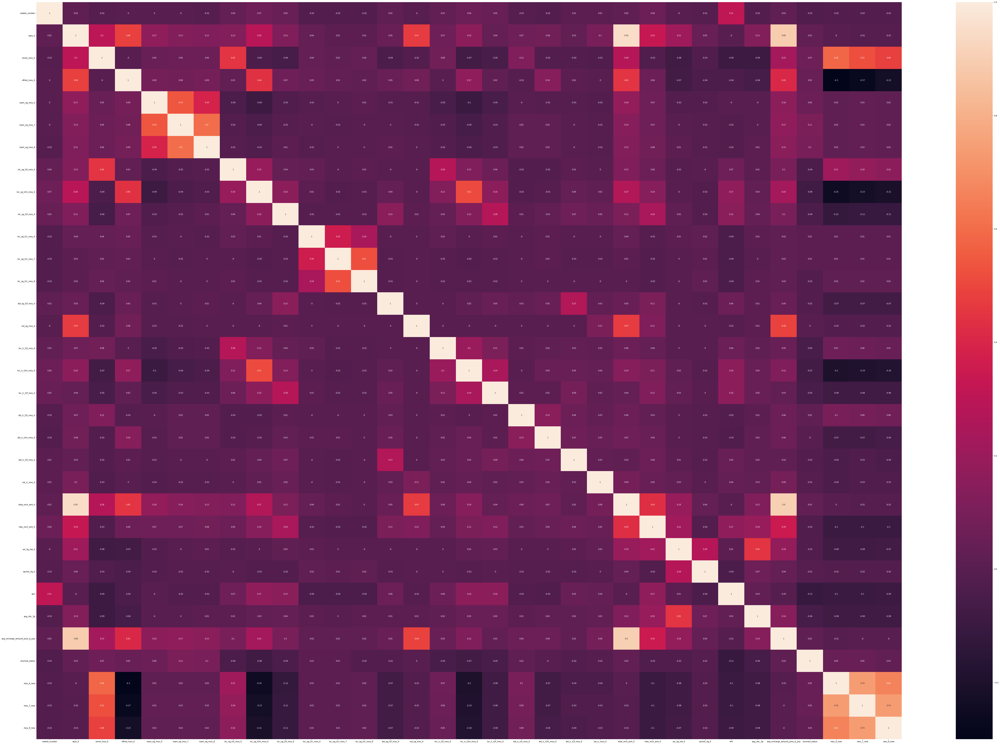

In [48]:
## Let's see the correlation matrix for our final dataset having less or no correlated varibales
plt.figure(figsize = (100,70))        # Size of the figure
sns.heatmap(round(telecom_churn_high_value_cust.corr(), 2),annot = True)
plt.show()

In [49]:
# Checking the shape of the derived datsets
telecom_churn_high_value_cust.shape

(28487, 36)

**4.5. Removing date columns**

In [50]:
# Let's drop all the date columns 
telecom_churn_high_value_cust.drop(['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'], axis=1, inplace = True)

In [51]:
telecom_churn_high_value_cust.info(all)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28487 entries, 7 to 99997
Data columns (total 33 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   mobile_number                    28487 non-null  int64  
 1   arpu_6                           28487 non-null  float64
 2   onnet_mou_6                      28487 non-null  float64
 3   offnet_mou_6                     28487 non-null  float64
 4   roam_og_mou_6                    28487 non-null  float64
 5   roam_og_mou_7                    28487 non-null  float64
 6   roam_og_mou_8                    28487 non-null  float64
 7   loc_og_t2t_mou_6                 28487 non-null  float64
 8   loc_og_t2m_mou_6                 28487 non-null  float64
 9   loc_og_t2f_mou_6                 28487 non-null  float64
 10  loc_og_t2c_mou_6                 28487 non-null  float64
 11  loc_og_t2c_mou_7                 28487 non-null  float64
 12  loc_og_t2c_mou_8  

**4.6. Outliers Treatment**


In [52]:
# Checking for outliers in the continuous variables - Set I
new_telecom_churn_high_value_cust = telecom_churn_high_value_cust[['arpu_6','onnet_mou_6','offnet_mou_6','roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'std_og_t2f_mou_6', 'isd_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'loc_ic_t2f_mou_6']]

In [53]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99% - Set I
new_telecom_churn_high_value_cust.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,arpu_6,onnet_mou_6,offnet_mou_6,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,std_og_t2f_mou_6,isd_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,loc_ic_t2f_mou_6
count,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000
mean,584.906157,296.930201,418.341422,29.214085,22.242011,22.332102,96.339015,183.384868,7.074418,1.579629,2.005597,2.077018,69.960276,162.059632,15.938921,16.312507,32.139282,15.938921
std,430.034924,457.517164,462.763446,117.996842,99.098876,108.633169,239.259323,248.364368,22.923067,6.935404,12.253122,45.654924,158.568887,219.900103,46.422450,79.753637,99.251424,46.422450
min,-810.661000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,364.794500,43.470000,141.955000,0.000000,0.000000,0.000000,9.035000,32.440000,0.000000,0.000000,0.000000,0.000000,9.090000,35.780000,0.000000,0.000000,0.560000,0.000000
50%,493.397000,128.740000,285.490000,0.000000,0.000000,0.000000,33.680000,104.660000,0.400000,0.000000,0.000000,0.000000,30.230000,96.990000,2.110000,1.140000,7.360000,2.110000
75%,697.488000,355.495000,522.870000,0.000000,0.000000,0.000000,93.470000,243.110000,5.230000,0.000000,0.000000,0.000000,75.270000,206.200000,12.880000,10.495000,27.845000,12.880000
90%,984.668000,791.600000,907.472000,65.092000,41.438000,39.848000,210.550000,436.892000,18.618000,4.110000,2.218000,0.000000,156.330000,371.438000,40.198000,34.790000,73.720000,40.198000
95%,1230.005700,1145.565000,1254.768000,168.146000,120.471000,120.136000,352.090000,614.816000,34.130000,8.740000,8.160000,1.010000,247.653000,524.988000,74.085000,65.139000,127.003000,74.085000
99%,1951.548380,2156.100800,2285.619400,534.406800,453.242400,449.125200,1076.517200,1136.971200,91.217000,24.860000,44.627800,36.547800,633.088000,1026.536000,199.542800,213.556800,394.684800,199.542800


In [54]:
# Checking for outliers in the continuous variables - Set II
new_telecom_churn_high_value_cust = telecom_churn_high_value_cust[['isd_ic_mou_6', 'total_rech_amt_6', 'max_rech_amt_6', 'vol_3g_mb_6', 'sachet_3g_6', 'aug_vbc_3g']]

In [55]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99% - Set II
new_telecom_churn_high_value_cust.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,isd_ic_mou_6,total_rech_amt_6,max_rech_amt_6,vol_3g_mb_6,sachet_3g_6,aug_vbc_3g
count,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000,28487.000000
mean,10.957854,693.506722,167.601748,247.950748,0.138905,132.866144
std,66.674196,526.357015,162.753528,790.738552,0.876278,394.146064
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,432.000000,110.000000,0.000000,0.000000,0.000000
50%,0.000000,580.000000,120.000000,0.000000,0.000000,0.000000
75%,0.000000,828.500000,200.000000,0.000000,0.000000,8.030000
90%,14.660000,1168.400000,269.000000,857.908000,0.000000,455.970000
95%,44.924000,1457.700000,455.000000,1459.098000,1.000000,835.082000
99%,237.499200,2342.280000,1000.000000,3419.221000,3.000000,1823.736000




Observation;


---


1.   Based on the first correlation matrix, there were 74 different variables which were highly correlated. Therefore, those highly co-related columns have been droped off.

2.   The final correlation metrics dervied is as shown below. As consequence of this now we will move towards model building with the derived dataset having shape of total #26463 numbers of rows and total #35 numbers of columns

3.   We have done outliers check in two different sets for better interpretability, and found that there's no outlier present in all 34 columns



# **Step 5 : Model Building Without PCA**



**5.1. Test train data split**



In [56]:
# Test-Train data split
# Putting feature variable to X
X = telecom_churn_high_value_cust.drop(['churned_status', 'mobile_number'],axis=1)

# Putting response variable to y
y = telecom_churn_high_value_cust['churned_status']

y.head()

7     1
8     0
13    0
16    0
17    0
Name: churned_status, dtype: int64

In [57]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

**5.2. Resolving Data imbalance issues**



>  **Imbalanced data** : Imbalance means that the number of data points available for the classes is different. Let's say if there are two classes, then balanced data would mean 50% points for each of the class. For most machine learning techniques, little imbalance is not a problem. So, if there are 60% points for one class and 40% for the other class, it should not cause any significant performance degradation. Only when the class imbalance is high, e.g. 85%-90% points for one class and 10%-15% for the other, standard optimization criteria or performance measures may not be as effective and would need modification.

>Let's resolve the data imbalance issues using SMOT technique before moving towards Model Building


In [58]:
# Importing SMOTE
from imblearn.over_sampling import SMOTE

In [59]:
# Instantiate SMOTE
sm = SMOTE(random_state=27)

In [60]:
# Fittign SMOTE to the train set
X_train, y_train = sm.fit_resample(X_train, y_train)

**5.3. Scaling of the datset**

In [61]:
# Normalize the data
scaler = StandardScaler()

X_train[['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'std_og_t2f_mou_6', 'isd_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'isd_ic_mou_6', 'total_rech_amt_6', 'max_rech_amt_6', 'vol_3g_mb_6', 'sachet_3g_6', 'aon', 'aug_vbc_3g', 'avg_recharge_amount_June_&_July', 'mou_6_new', 'mou_7_new', 'mou_8_new']] = scaler.fit_transform(X_train[['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'std_og_t2f_mou_6', 'isd_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'isd_ic_mou_6', 'total_rech_amt_6', 'max_rech_amt_6', 'vol_3g_mb_6', 'sachet_3g_6', 'aon', 'aug_vbc_3g', 'avg_recharge_amount_June_&_July', 'mou_6_new', 'mou_7_new', 'mou_8_new']])

X_train.head()



,arpu_6,onnet_mou_6,offnet_mou_6,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2f_mou_6,isd_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,isd_ic_mou_6,total_rech_amt_6,max_rech_amt_6,vol_3g_mb_6,sachet_3g_6,aon,aug_vbc_3g,avg_recharge_amount_June_&_July,mou_6_new,mou_7_new,mou_8_new
0,-0.896695,-0.079179,-0.771206,-0.262177,-0.274851,-0.276998,-0.348992,-0.584794,-0.202444,-0.145446,-0.21723,-0.237460,-0.154097,-0.052587,-0.402760,-0.615196,-0.301599,-0.168746,-0.342156,-0.12887,-0.174568,-0.891766,-0.780193,-0.284802,-0.139701,0.062680,-0.272294,-0.621559,1.468809,1.547701,1.729871
1,-0.346342,0.551920,-0.197092,-0.262177,-0.274851,-0.276998,0.356332,0.091501,-0.202444,0.568332,-0.21723,0.573711,-0.154097,-0.052587,-0.208000,0.719031,0.557368,-0.126649,-0.103709,-0.12887,-0.174568,-0.422488,-0.292642,-0.284802,-0.139701,0.544938,-0.272294,-0.435668,1.468809,1.547701,1.729871
2,-0.407355,-0.682600,-0.837769,-0.262177,-0.274851,-0.276998,-0.359201,-0.688094,-0.202444,-0.177586,-0.21723,-0.237460,-0.154097,-0.052587,-0.460596,-0.685713,-0.301599,-0.221761,-0.323282,-0.12887,-0.174568,-0.408858,0.642930,2.564807,-0.139701,-0.874858,0.141553,-0.420538,-0.680824,-0.646120,-0.578078
3,1.236397,-0.252843,0.493121,0.266329,-0.274851,0.225566,0.502524,2.343698,-0.101819,-0.219101,-0.21723,-0.237460,-0.082888,-0.031864,0.113266,1.413434,-0.252426,-0.207159,-0.270176,-0.12887,-0.042161,0.751678,2.606312,-0.284802,-0.139701,-0.121680,-0.272294,0.208464,-0.680824,-0.646120,-0.578078
4,-1.356404,-0.680501,-0.833090,-0.235120,-0.274851,-0.276998,-0.359201,-0.688094,-0.202444,-0.219101,-0.21723,-0.237460,-0.154097,-0.052587,-0.460596,-0.699731,-0.301599,-0.221761,-0.342156,-0.12887,-0.174568,-1.331835,-0.951495,-0.284802,-0.139701,-0.334144,-0.185277,-0.054160,-0.680824,-0.646120,-0.578078


In [62]:
# Let's check all the columns from derived dataset 
telecom_churn_high_value_cust.info(all)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28487 entries, 7 to 99997
Data columns (total 33 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   mobile_number                    28487 non-null  int64  
 1   arpu_6                           28487 non-null  float64
 2   onnet_mou_6                      28487 non-null  float64
 3   offnet_mou_6                     28487 non-null  float64
 4   roam_og_mou_6                    28487 non-null  float64
 5   roam_og_mou_7                    28487 non-null  float64
 6   roam_og_mou_8                    28487 non-null  float64
 7   loc_og_t2t_mou_6                 28487 non-null  float64
 8   loc_og_t2m_mou_6                 28487 non-null  float64
 9   loc_og_t2f_mou_6                 28487 non-null  float64
 10  loc_og_t2c_mou_6                 28487 non-null  float64
 11  loc_og_t2c_mou_7                 28487 non-null  float64
 12  loc_og_t2c_mou_8  



**5.4. Feature Selection using RFE**



In [63]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

In [64]:
from sklearn.feature_selection import RFE
rfe = RFE(logreg, n_features_to_select=25)             # running RFE for 25 variables as output and to get right prediction
rfe = rfe.fit(X_train, y_train)

In [65]:
rfe.support_

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True,  True,  True, False,  True,  True,  True, False,
        True,  True, False,  True,  True, False,  True,  True,  True,
        True,  True,  True,  True])

In [66]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 2),
 ('onnet_mou_6', True, 1),
 ('offnet_mou_6', True, 1),
 ('roam_og_mou_6', True, 1),
 ('roam_og_mou_7', True, 1),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2t_mou_6', True, 1),
 ('loc_og_t2m_mou_6', True, 1),
 ('loc_og_t2f_mou_6', True, 1),
 ('loc_og_t2c_mou_6', False, 7),
 ('loc_og_t2c_mou_7', True, 1),
 ('loc_og_t2c_mou_8', True, 1),
 ('std_og_t2f_mou_6', True, 1),
 ('isd_og_mou_6', False, 3),
 ('loc_ic_t2t_mou_6', True, 1),
 ('loc_ic_t2m_mou_6', True, 1),
 ('loc_ic_t2f_mou_6', True, 1),
 ('std_ic_t2t_mou_6', False, 5),
 ('std_ic_t2m_mou_6', True, 1),
 ('std_ic_t2f_mou_6', True, 1),
 ('isd_ic_mou_6', False, 6),
 ('total_rech_amt_6', True, 1),
 ('max_rech_amt_6', True, 1),
 ('vol_3g_mb_6', False, 4),
 ('sachet_3g_6', True, 1),
 ('aon', True, 1),
 ('aug_vbc_3g', True, 1),
 ('avg_recharge_amount_June_&_July', True, 1),
 ('mou_6_new', True, 1),
 ('mou_7_new', True, 1),
 ('mou_8_new', True, 1)]

In [67]:
col = X_train.columns[rfe.support_]
col

Index(['onnet_mou_6', 'offnet_mou_6', 'roam_og_mou_6', 'roam_og_mou_7',
       'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6',
       'loc_og_t2f_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8',
       'std_og_t2f_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6',
       'loc_ic_t2f_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6',
       'total_rech_amt_6', 'max_rech_amt_6', 'sachet_3g_6', 'aon',
       'aug_vbc_3g', 'avg_recharge_amount_June_&_July', 'mou_6_new',
       'mou_7_new', 'mou_8_new'],
      dtype='object')

In [68]:
X_train.columns[~rfe.support_]

Index(['arpu_6', 'loc_og_t2c_mou_6', 'isd_og_mou_6', 'std_ic_t2t_mou_6',
       'isd_ic_mou_6', 'vol_3g_mb_6'],
      dtype='object')

**5.5. Logistic Regression Model (Wihtout PCA) : ML Model - I** 



>**5.5.1. Model Building without PCA**



In [69]:
import statsmodels.api as sm

In [70]:
# Adding a constant 
X_train_sm = sm.add_constant(X_train[col])
logm1 = sm.GLM(y_train,X_train_sm, class_weight='balanced', family = sm.families.Binomial()) # Using class_weight to deal with imbalanced data

In [71]:
# Getting the summary
res = logm1.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:         churned_status   No. Observations:                37030
Model:                            GLM   Df Residuals:                    37004
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -21463.
Date:                Tue, 06 Dec 2022   Deviance:                       42926.
Time:                        14:11:33   Pearson chi2:                 1.00e+05
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const                              -0.0389      0.012     -3.205      0.001      -0.063      -0.015
onnet_mou_6                         0.4598      0.022     20.917      0.000       0.417       0.503
offnet_mou_6                        0.0584      0.016      3.623      0.000       0.027       0.090
roam_og_mou_6                      -0.1626      0.017     -9.553      0.000      -0.196      -0.129
roam_og_mou_7                       0.2246      0.023      9.562      0.000       0.179       0.271
roam_og_mou_8                       0.3561      0.024     14.908      0.000       0.309       0.403
loc_og_t2t_mou_6                   -0.1387      0.015     -9.489      0.000      -0.167      -0.110
loc_og_t2m_mou_6                   -0.3636      0.019    -19.303      0.000      -0.401      -0.327
loc_og_t2f_mou_6                   -0.0711      0.013     -5.277      0.000      -0.098      -0.045
loc_og_t2c_mou_7                    0.0568      0.016      3.584      0.000       0.026       0.088
loc_og_t2c_mou_8                   -0.1280      0.016     -7.947      0.000      -0.160      -0.096
std_og_t2f_mou_6                   -0.0555      0.015     -3.702      0.000      -0.085      -0.026
loc_ic_t2t_mou_6                   -0.1439      0.018     -7.913      0.000      -0.180      -0.108
loc_ic_t2m_mou_6                   -0.1142      0.018     -6.354      0.000      -0.149      -0.079
loc_ic_t2f_mou_6                   -0.1690      0.020     -8.315      0.000      -0.209      -0.129
std_ic_t2m_mou_6                   -0.1260      0.014     -8.946      0.000      -0.154      -0.098
std_ic_t2f_mou_6                   -0.0999      0.024     -4.096      0.000      -0.148      -0.052
total_rech_amt_6                    0.4868      0.034     14.492      0.000       0.421       0.553
max_rech_amt_6                     -0.1100      0.016     -6.803      0.000      -0.142      -0.078
sachet_3g_6                        -0.0841      0.013     -6.257      0.000      -0.110      -0.058
aon                                -0.4050      0.013    -31.026      0.000      -0.431      -0.379
aug_vbc_3g                         -0.4400      0.020    -21.647      0.000      -0.480      -0.400
avg_recharge_amount_June_&_July    -0.4060      0.030    -13.762      0.000      -0.464      -0.348
mou_6_new                           0.0451      0.021      2.130      0.033       0.004       0.087
mou_7_new                          -0.0996      0.021     -4.733      0.000      -0.141      -0.058
mou_8_new                          -0.4674      0.017    -27.270      0.000      -0.501      -0.434
===================================================================================================
"""

In [72]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

0    0.357305
1    0.238199
2    0.640948
3    0.342566
4    0.520592
5    0.671432
6    0.717793
7    0.126785
8    0.230315
9    0.509747
dtype: float64

In [73]:
#Creating a dataframe with the actual churn flag and the predicted probabilities
y_train_pred_final = pd.DataFrame({'churned_status':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['mobile_number'] = y_train.index
y_train_pred_final.head()

,churned_status,Churn_Prob,mobile_number
0,0,0.357305,0
1,0,0.238199,1
2,0,0.640948,2
3,0,0.342566,3
4,0,0.520592,4


In [74]:
#Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,churned_status,Churn_Prob,mobile_number,predicted
0,0,0.357305,0,0
1,0,0.238199,1,0
2,0,0.640948,2,1
3,0,0.342566,3,0
4,0,0.520592,4,1


>**5.5.2. Model Evaluation - I**

In [75]:
from sklearn import metrics

In [76]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.churned_status, y_train_pred_final.predicted )
print(confusion)

[[12389  6126]
 [ 4854 13661]]


In [77]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.churned_status, y_train_pred_final.predicted))

0.7034836618957602


In [78]:
# Let's check Metrics beyond simply accuracy

In [79]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [80]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.7378341884958142

In [81]:
# Let us calculate specificity
TN / float(TN+FP)

0.6691331352957062

In [82]:
#Plotting the ROC Curve
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False)
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [83]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.churned_status, y_train_pred_final.churned_status, drop_intermediate = False )

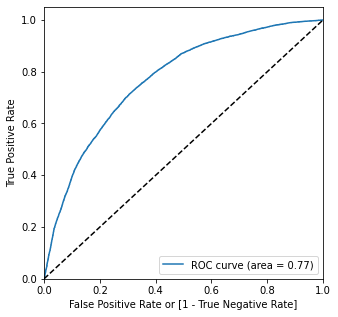

In [84]:
draw_roc(y_train_pred_final.churned_status, y_train_pred_final.Churn_Prob)

**Observation**


---

ROC obtained for logistic regression model is 0.77.
Also below are the key model performance parameters achieved on train set data;

*   Model accuracy : 0.70
*   Sensitivity : 0.74
*   Specificity : 0.67 









> **5.5.3. Model Evaluation - II**



In [85]:
#Optimal cutoff probability is that prob where we get balanced sensitivity and specificity
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,churned_status,Churn_Prob,mobile_number,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.357305,0,0,1,1,1,1,0,0,0,0,0,0
1,0,0.238199,1,0,1,1,1,0,0,0,0,0,0,0
2,0,0.640948,2,1,1,1,1,1,1,1,1,0,0,0
3,0,0.342566,3,0,1,1,1,1,0,0,0,0,0,0
4,0,0.520592,4,1,1,1,1,1,1,1,0,0,0,0


In [86]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.churned_status, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.540643  0.992331  0.088955
0.2   0.2  0.590656  0.969646  0.211666
0.3   0.3  0.645261  0.928868  0.361653
0.4   0.4  0.689900  0.856441  0.523359
0.5   0.5  0.703484  0.737834  0.669133
0.6   0.6  0.685309  0.567540  0.803079
0.7   0.7  0.624278  0.326924  0.921631
0.8   0.8  0.550527  0.125142  0.975911
0.9   0.9  0.515960  0.040130  0.991790


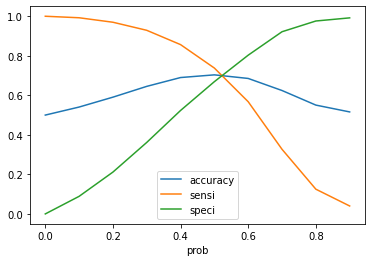

In [87]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

**Observation;**


---

From the curve above, 0.52 is the optimum point to take it as a cutoff probability.


>**5.5.4. Making Prediction on train dataset**

In [88]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.3 else 0)

y_train_pred_final.head()

,churned_status,Churn_Prob,mobile_number,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.357305,0,0,1,1,1,1,0,0,0,0,0,0,1
1,0,0.238199,1,0,1,1,1,0,0,0,0,0,0,0,0
2,0,0.640948,2,1,1,1,1,1,1,1,1,0,0,0,1
3,0,0.342566,3,0,1,1,1,1,0,0,0,0,0,0,1
4,0,0.520592,4,1,1,1,1,1,1,1,0,0,0,0,1


>**5.5.5. Evaluating model performance based on predicted values**

In [89]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.churned_status, y_train_pred_final.final_predicted)

0.6452605995139077

In [90]:
confusion2 = metrics.confusion_matrix(y_train_pred_final.churned_status, y_train_pred_final.final_predicted )
confusion2

array([[ 6696, 11819],
       [ 1317, 17198]])

In [91]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [92]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.9288684850121524

In [93]:
# Let us calculate specificity
TN / float(TN+FP)

0.36165271401566296

In [94]:
#Calculating Precision
confusion[1,1]/(confusion[0,1]+confusion[1,1])

0.6904027897104159

In [95]:
#Calculating Recall
confusion[1,1]/(confusion[1,0]+confusion[1,1])

0.7378341884958142

In [96]:
#Precision and recall tradeoff
from sklearn.metrics import precision_recall_curve
y_train_pred_final.churned_status, y_train_pred_final.predicted

(0        0
 1        0
 2        0
 3        0
 4        0
         ..
 37025    1
 37026    1
 37027    1
 37028    1
 37029    1
 Name: churned_status, Length: 37030, dtype: int64, 0        0
 1        0
 2        1
 3        0
 4        1
         ..
 37025    1
 37026    1
 37027    0
 37028    0
 37029    1
 Name: predicted, Length: 37030, dtype: int64)

In [97]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.churned_status, y_train_pred_final.Churn_Prob)

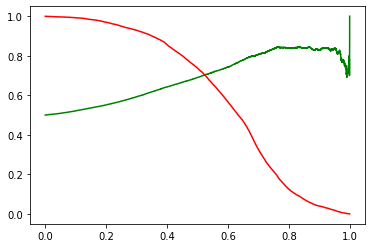

In [98]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

>**5.5.6. Making predictions on the test dataset**

In [99]:
# Normalize the data
scaler = StandardScaler()

X_test[['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'std_og_t2f_mou_6', 'isd_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'isd_ic_mou_6', 'total_rech_amt_6', 'max_rech_amt_6', 'vol_3g_mb_6', 'sachet_3g_6', 'aon', 'aug_vbc_3g', 'avg_recharge_amount_June_&_July', 'mou_6_new', 'mou_7_new', 'mou_8_new']] = scaler.fit_transform(X_test[['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'std_og_t2f_mou_6', 'isd_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'isd_ic_mou_6', 'total_rech_amt_6', 'max_rech_amt_6', 'vol_3g_mb_6', 'sachet_3g_6', 'aon', 'aug_vbc_3g', 'avg_recharge_amount_June_&_July', 'mou_6_new', 'mou_7_new', 'mou_8_new']])

X_test.head()



,arpu_6,onnet_mou_6,offnet_mou_6,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2f_mou_6,isd_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,isd_ic_mou_6,total_rech_amt_6,max_rech_amt_6,vol_3g_mb_6,sachet_3g_6,aon,aug_vbc_3g,avg_recharge_amount_June_&_July,mou_6_new,mou_7_new,mou_8_new
29000,0.057785,-0.556042,-0.135641,-0.241311,-0.236719,-0.214861,-0.265163,0.457778,1.190478,-0.246155,-0.155461,-0.242988,-0.167834,-0.091005,0.042155,2.741718,4.085441,-0.042324,0.133630,-0.190263,-0.177298,-0.017824,-0.351704,-0.318306,-0.154049,-0.965333,-0.342134,-0.137750,-0.663218,-0.658285,-0.646075
89064,-0.769072,-0.356189,-0.310055,-0.241311,-0.236719,-0.214861,0.139275,0.331424,-0.119006,-0.246155,-0.178281,-0.242988,-0.167834,-0.091005,-0.113852,-0.005813,0.958240,-0.212490,-0.282627,-0.190263,-0.177298,-0.719051,-0.351704,-0.318306,-0.154049,-0.581503,-0.342134,-0.708508,-0.663218,-0.658285,-0.646075
83052,-0.412647,-0.605646,-0.778682,-0.241311,-0.236719,-0.214861,-0.319573,-0.529718,-0.278612,-0.246155,-0.178281,-0.106399,-0.167834,-0.091005,-0.324678,-0.546166,-0.357618,-0.196525,-0.217181,-0.190263,-0.177298,-0.324870,-0.083228,0.861724,-0.154049,-0.778024,0.802320,-0.566401,-0.663218,-0.658285,-0.646075
84827,-0.225553,-0.614660,-0.141934,-0.241311,-0.236719,-0.214861,-0.335703,0.650949,-0.338783,-0.246155,-0.083491,0.100514,-0.167834,-0.091005,-0.269222,0.267355,-0.294344,-0.212490,-0.208239,-0.190263,-0.177298,-0.353915,-0.351704,-0.318306,-0.154049,-0.413641,-0.342134,-0.387020,-0.663218,-0.658285,-0.646075
82119,-0.028615,1.074574,0.090308,-0.153560,-0.236719,-0.214861,0.045365,-0.050038,-0.338783,-0.246155,-0.178281,-0.242988,-0.167834,-0.091005,0.971250,0.218642,-0.374410,4.192102,1.531472,-0.190263,-0.177298,0.143998,-0.351704,-0.318306,-0.154049,-0.074848,-0.342134,-0.699190,1.507799,1.519099,1.547808


In [100]:
X_test_1 = X_test[col]
X_test_1.head()

,onnet_mou_6,offnet_mou_6,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2f_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,total_rech_amt_6,max_rech_amt_6,sachet_3g_6,aon,aug_vbc_3g,avg_recharge_amount_June_&_July,mou_6_new,mou_7_new,mou_8_new
29000,-0.556042,-0.135641,-0.241311,-0.236719,-0.214861,-0.265163,0.457778,1.190478,-0.155461,-0.242988,-0.167834,0.042155,2.741718,4.085441,0.133630,-0.190263,-0.017824,-0.351704,-0.154049,-0.965333,-0.342134,-0.137750,-0.663218,-0.658285,-0.646075
89064,-0.356189,-0.310055,-0.241311,-0.236719,-0.214861,0.139275,0.331424,-0.119006,-0.178281,-0.242988,-0.167834,-0.113852,-0.005813,0.958240,-0.282627,-0.190263,-0.719051,-0.351704,-0.154049,-0.581503,-0.342134,-0.708508,-0.663218,-0.658285,-0.646075
83052,-0.605646,-0.778682,-0.241311,-0.236719,-0.214861,-0.319573,-0.529718,-0.278612,-0.178281,-0.106399,-0.167834,-0.324678,-0.546166,-0.357618,-0.217181,-0.190263,-0.324870,-0.083228,-0.154049,-0.778024,0.802320,-0.566401,-0.663218,-0.658285,-0.646075
84827,-0.614660,-0.141934,-0.241311,-0.236719,-0.214861,-0.335703,0.650949,-0.338783,-0.083491,0.100514,-0.167834,-0.269222,0.267355,-0.294344,-0.208239,-0.190263,-0.353915,-0.351704,-0.154049,-0.413641,-0.342134,-0.387020,-0.663218,-0.658285,-0.646075
82119,1.074574,0.090308,-0.153560,-0.236719,-0.214861,0.045365,-0.050038,-0.338783,-0.178281,-0.242988,-0.167834,0.971250,0.218642,-0.374410,1.531472,-0.190263,0.143998,-0.351704,-0.154049,-0.074848,-0.342134,-0.699190,1.507799,1.519099,1.547808


In [101]:
X_test_sm = sm.add_constant(X_test_1)

In [102]:
y_test_pred = res.predict(X_test_sm)

In [103]:
y_test_pred[:10]

29000    0.353110
89064    0.552406
83052    0.604885
84827    0.550047
82119    0.481574
33837    0.096339
54947    0.250928
32053    0.794027
68168    0.506070
61145    0.693209
dtype: float64

In [104]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [105]:
# Let's see the head
y_pred_1.head()

,0
29000,0.353110
89064,0.552406
83052,0.604885
84827,0.550047
82119,0.481574


In [106]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [107]:
# Putting Mobile number to index
y_test_df['mobile_number'] = y_test_df.index

In [108]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [109]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [110]:
y_pred_final.head()

,churned_status,mobile_number,0
0,1,29000,0.353110
1,0,89064,0.552406
2,0,83052,0.604885
3,0,84827,0.550047
4,0,82119,0.481574


In [111]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [112]:
# Rearranging the columns
y_pred_final = y_pred_final[['mobile_number','churned_status','Churn_Prob']]

In [113]:
# Let's see the head of y_pred_final
y_pred_final.head()

,mobile_number,churned_status,Churn_Prob
0,29000,1,0.353110
1,89064,0,0.552406
2,83052,0,0.604885
3,84827,0,0.550047
4,82119,0,0.481574


In [114]:
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.52 else 0)

> **5.5.7. Evaluating model performance based on predicted values**

In [115]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.churned_status, y_pred_final.final_predicted)

0.5491985491985492

In [116]:
confusion2 = metrics.confusion_matrix(y_pred_final.churned_status, y_pred_final.final_predicted )
confusion2

array([[4253, 3695],
       [ 158,  441]])

In [117]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [118]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.7362270450751253

In [119]:
# Let us calculate specificity
TN / float(TN+FP)

0.5351031706089582

**Observation**


---
Below are the key model performance parameters achieved on test set data;

*   Sensitivity : 0.73
*   Specificity : 0.653


**5.6.  Random Forest Model (Wihtout PCA)   : ML Model - II**

>**5.6.1. Model Building without PCA**

In [120]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import plot_roc_curve

In [121]:
rf = RandomForestClassifier(n_estimators=10, max_depth=4, max_features=5, random_state=100, oob_score=True)

In [122]:
%%time
rf.fit(X_train, y_train)

CPU times: user 542 ms, sys: 5.1 ms, total: 547 ms
Wall time: 548 ms


RandomForestClassifier(max_depth=4, max_features=5, n_estimators=10,
                       oob_score=True, random_state=100)

In [123]:
rf.oob_score_

0.7874156089657035

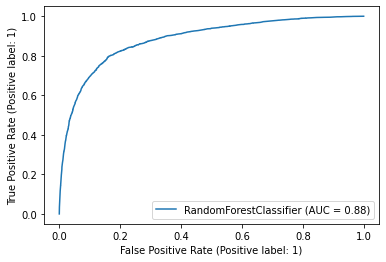

In [124]:
plot_roc_curve(rf, X_train, y_train)
plt.show()

**Observation**



---

Dervied AUC for random forest model is 0.88

In [125]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score

In [126]:
rf.estimators_[0]

DecisionTreeClassifier(max_depth=4, max_features=5, random_state=186422792)

In [127]:
sample_tree = rf.estimators_[4]

In [128]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

>**5.6.2. Model Evaluation - I**

In [129]:
evaluate_model(rf)

Train Accuracy : 0.8161490683229814
Train Confusion Matrix:
[[15396  3119]
 [ 3689 14826]]
--------------------------------------------------
Test Accuracy : 0.07078507078507079
Test Confusion Matrix:
[[   6 7942]
 [   0  599]]


From above analysis, we see that model performance is quite well on train set data but it doesn't perform well on train set data. Therefore, Let's conduct hyper-parameter tuning on this model



>**5.6.3. Hyper-Parameter Tuning**

In [130]:
#Grid search for hyper-parameter tuning
from sklearn.model_selection import GridSearchCV
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [131]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [1, 2, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'max_features': [2,3,4],
    'n_estimators': [10, 30, 50, 100, 200]
}

In [132]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=classifier_rf, param_grid=params, 
                          cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [ ]:
%%time
grid_search.fit(X,y)

Fitting 4 folds for each of 375 candidates, totalling 1500 fits


In [705]:
rf_best = grid_search.best_estimator_

In [706]:
rf_best

RandomForestClassifier(max_depth=20, max_features=4, min_samples_leaf=5,
                       n_estimators=30, n_jobs=-1, random_state=42)

>**5.6.4. Model Evaluation - II**

In [707]:
evaluate_model(rf_best)

Train Accuracy : 0.49997299486902513
Train Confusion Matrix:
[[18510     5]
 [18511     4]]
--------------------------------------------------
Test Accuracy : 0.9299169299169299
Test Confusion Matrix:
[[7948    0]
 [ 599    0]]


Obervation;


---
After, hyper-parameter tuning, we can see thatRandom forest model gives accuracy of 92% on test data.



**5.7. Decision tree Model (Without PCA) : ML Model - III**



> **5.7.1. Model Building without PCA**



In [709]:
from sklearn.tree import DecisionTreeClassifier

In [710]:
dt = DecisionTreeClassifier(max_depth=3)
dt.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

In [711]:
!pip install six

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [712]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

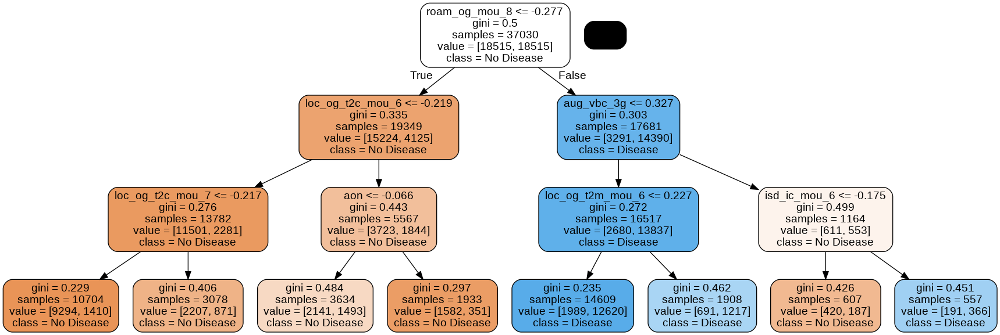

In [713]:
# plotting tree with max_depth=3
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X.columns, 
                class_names=['No Disease', "Disease"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())
#Image(graph.create_png(),width=800,height=900)
#graph.write_pdf("dt_heartdisease.pdf")

>**5.7.2. Model Evaluation**

In [714]:
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

In [715]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [716]:
print(accuracy_score(y_train, y_train_pred))
confusion_matrix(y_train, y_train_pred)

0.8060221442073994


array([[15644,  2871],
       [ 4312, 14203]])

In [ ]:
#Creating functions to evaluate model performance which may help plotting the decision tree

In [718]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X.columns, 
                    class_names=['Disease', "No Disease"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [719]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(X_train)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(X_train)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))

>**5.7.3. Hyper-Parameter Tuning**

In [722]:
#Controlling the depth of the tree
dt_depth = DecisionTreeClassifier(max_depth=5)
dt_depth.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5)

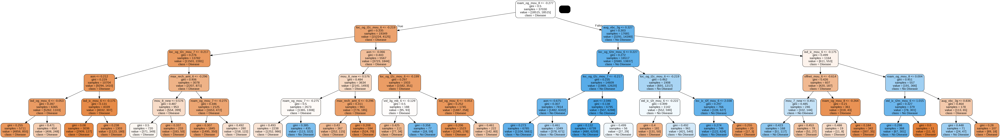

In [730]:
gph = get_dt_graph(dt_depth) 
Image(gph.create_png())

In [738]:
dt = DecisionTreeClassifier(random_state=42)

In [739]:
from sklearn.model_selection import GridSearchCV

In [740]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'criterion': ["gini", "entropy"]
}

In [741]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [742]:
%%time
grid_search.fit(X_train, y_train)

Fitting 4 folds for each of 50 candidates, totalling 200 fits
CPU times: user 3.05 s, sys: 238 ms, total: 3.29 s
Wall time: 1min 31s


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 20],
                         'min_samples_leaf': [5, 10, 20, 50, 100]},
             scoring='accuracy', verbose=1)

In [743]:
score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.219116,0.007397,0.005582,0.000137,gini,2,5,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.781702,0.804061,0.811386,0.80242,0.799892,0.011031,41
1,0.200988,0.004864,0.005932,0.001176,gini,2,10,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.781702,0.804061,0.811386,0.80242,0.799892,0.011031,41
2,0.199035,0.006911,0.005761,0.000441,gini,2,20,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.781702,0.804061,0.811386,0.80242,0.799892,0.011031,41
3,0.201985,0.003167,0.005486,0.000442,gini,2,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.781702,0.804061,0.811386,0.80242,0.799892,0.011031,41
4,0.202759,0.007864,0.005232,0.000144,gini,2,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.781702,0.804061,0.811386,0.80242,0.799892,0.011031,41


In [744]:
grid_search.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=5,
                       random_state=42)

In [745]:
dt_best = grid_search.best_estimator_

>**5.7.4. Model Evaluation**

In [746]:
evaluate_model(dt_best)

Train Accuracy : 0.9619497704563867
Train Confusion Matrix:
[[17876   639]
 [  770 17745]]
--------------------------------------------------
Test Accuracy : 0.29542529542529544
Test Confusion Matrix:
[[2027 5921]
 [ 101  498]]


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.249931 to fit



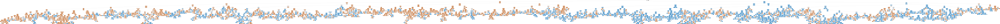

In [747]:
gph = get_dt_graph(dt_best)
Image(gph.create_png())

**Observations;**


---
From the derived model perfomance of Decision tree, it is recommended to not go with this model for the given datset.

To conclude on ML model building without PCA for the given datsets, Machine learning Model built on Random Forest algorithm performs best followed by Logistic regression and then Decision tree algorithm.


**Recomendation;**

---

ML model-II built on Random Forest Algorithm without PCA is recommended for the given datset**


# **Step 6 : Model Building With PCA**

**6.1. Preparing PCA Framework**

In [133]:
#Import PCA
from sklearn.decomposition import PCA

In [134]:
# Instantiate PCA
pca = PCA(random_state=42)

In [135]:
# Fit train set on PCA
pca.fit(X_train)

PCA(random_state=42)

In [136]:
# Principal components
pca.components_

array([[ 4.42205681e-01,  4.60045742e-02,  2.68039636e-01,
         1.57619848e-01,  1.56362698e-01,  1.34527813e-01,
         5.83958848e-02,  2.00857053e-01,  1.27224472e-01,
         2.62769877e-02,  1.90955323e-02,  1.93546030e-02,
         7.18846425e-02,  2.15775024e-01,  6.43673451e-02,
         1.44626240e-01,  7.21444114e-02,  3.12180334e-02,
         6.52578006e-02,  3.97368984e-02,  6.88731534e-02,
         4.45219521e-01,  2.61009181e-01,  1.02708803e-01,
         2.21966456e-02,  5.20369537e-02,  8.45152516e-02,
         4.27709834e-01, -1.17141338e-01, -1.16322985e-01,
        -1.03719984e-01],
       [ 1.51673909e-01,  4.33887968e-01, -1.07998648e-01,
         8.42869587e-02,  8.20268285e-02,  8.20041103e-02,
         1.43573193e-01, -1.57080575e-01, -6.05361014e-02,
         1.83428170e-02,  2.08309081e-02,  2.78416058e-02,
        -6.41326431e-02,  6.17882372e-02,  1.89432650e-02,
        -1.55643269e-01, -9.96926663e-02,  9.81777539e-02,
        -4.68530068e-02, -4.61

In [137]:
# Cumuliative varinace of the PCs
variance_cumu = np.cumsum(pca.explained_variance_ratio_)
print(variance_cumu)

[0.13236654 0.23704502 0.31241112 0.37172916 0.42583373 0.47910961
 0.52341352 0.56070159 0.59521698 0.62708926 0.65780435 0.68770231
 0.71583586 0.74311533 0.7697249  0.79523687 0.81993867 0.84253751
 0.86390278 0.88435707 0.90284396 0.91997371 0.93572554 0.94945222
 0.96168718 0.97202641 0.98069243 0.98825285 0.99508331 0.99885516
 1.        ]


Text(0, 0.5, 'Cumulative Variance')

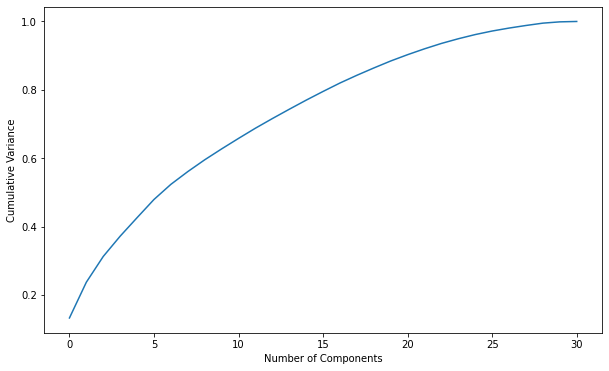

In [138]:
# Plotting scree plot
fig = plt.figure(figsize = (10,6))
plt.plot(variance_cumu)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance')

**Observation;**


---
From the plotted scree plot it can be seen that #30 components explain almost 99% variance of the given dataset. Therefore, let's perform PCA with all these 30 components.


In [139]:
# Importing incremental PCA
from sklearn.decomposition import IncrementalPCA

In [140]:
# Instantiate PCA with 30 components
pca_final = IncrementalPCA(n_components=30)

In [141]:
# Fit and transform the X_train
X_train_pca = pca_final.fit_transform(X_train)

In [142]:
# Since fitting is done for train set, let's do only transform of test set
X_test_pca = pca_final.transform(X_test)

**6.2. Logistic Regression Model (With PCA) : ML Model - IV**





> **6.2.1. Model Building with PCA**



In [143]:
# Importing scikit logistic regression module
from sklearn.linear_model import LogisticRegression

In [144]:
# Importing metrics
from sklearn import metrics
from sklearn.metrics import confusion_matrix



> **6.2.2. Hyper-Parameter Tuning**



In [145]:
# Tuning hyperparameter C
# C is the the inverse of regularization strength in Logistic Regression. Higher values of C correspond to less regularization.

In [146]:
# Importing libraries for cross validation
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [147]:
# Creating KFold object with 5 splits
from sklearn.linear_model import LogisticRegression
folds = KFold(n_splits=5, shuffle=True, random_state=4)

# Specify params
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]}

# Specifing score as recall as we are more focused on acheiving the higher sensitivity than the accuracy
model_cv = GridSearchCV(estimator = LogisticRegression(),
                        param_grid = params, 
                        scoring= 'recall', 
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True) 

# Fit the model
model_cv.fit(X_train_pca, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='recall', verbose=1)

In [148]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.163577,0.014753,0.006991,0.002306,0.01,{'C': 0.01},0.739510,0.739711,0.738965,0.732271,0.738038,0.737699,0.002775,1,0.739576,0.739661,0.740923,0.735254,0.734872,0.738057,0.002494
1,0.166671,0.005396,0.005709,0.000209,0.1,{'C': 0.1},0.738692,0.736440,0.738420,0.732537,0.736969,0.736611,0.002207,2,0.738498,0.738381,0.739037,0.733220,0.734060,0.736639,0.002473
2,0.169421,0.012671,0.006029,0.000376,1,{'C': 1},0.738147,0.735350,0.738420,0.732537,0.736701,0.736231,0.002150,3,0.738363,0.738044,0.738767,0.733356,0.733857,0.736477,0.002361
3,0.173417,0.024333,0.006256,0.000685,10,{'C': 10},0.738147,0.735350,0.738420,0.732537,0.736701,0.736231,0.002150,3,0.738363,0.737977,0.738700,0.733492,0.733789,0.736464,0.002319
4,0.177172,0.015048,0.006023,0.000606,100,{'C': 100},0.738147,0.735350,0.738420,0.732537,0.736701,0.736231,0.002150,3,0.738363,0.737977,0.738700,0.733492,0.733789,0.736464,0.002319
5,0.197635,0.017498,0.006486,0.000419,1000,{'C': 1000},0.738147,0.735350,0.738420,0.732537,0.736701,0.736231,0.002150,3,0.738363,0.737977,0.738700,0.733492,0.733789,0.736464,0.002319


>**6.2.3. Model Evaluation**

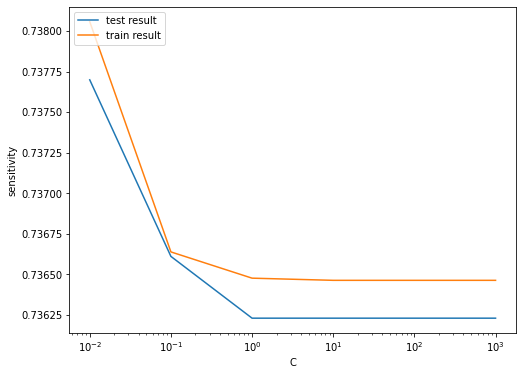

In [149]:
# plot of C versus train and validation scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('sensitivity')
plt.legend(['test result', 'train result'], loc='upper left')
plt.xscale('log')

In [150]:
# Best score with best C
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test sensitivity is {0} at C = {1}".format(best_score, best_C))

 The highest test sensitivity is 0.7376988162964475 at C = 0.01


In [ ]:
#Logistic regression with optimal C

In [151]:
# Instantiate the model with best C
logistic_pca = LogisticRegression(C=best_C)

In [152]:
# Fit the model on the train set
log_pca_model = logistic_pca.fit(X_train_pca, y_train)

>**6.2.4. Making Prediction on train dataset**

In [153]:
# Predictions on the train set
y_train_pred = log_pca_model.predict(X_train_pca)

>**6.2.5. Evaluating model performance based on predicted values**

In [154]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train, y_train_pred)
print(confusion)

[[12355  6160]
 [ 4858 13657]]


In [155]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [156]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

Accuracy:- 0.7024574669187146
Sensitivity:- 0.7376181474480151
Specificity:- 0.667296786389414


>**6.2.6. Making Prediction on test dataset**

In [157]:
# Prediction on the test set
y_test_pred = log_pca_model.predict(X_test_pca)

> **6.2.7. Evaluating model performance based on predicted values**

In [158]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[4006 3942]
 [ 140  459]]


In [159]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [160]:
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

Accuracy:- 0.5224055224055224
Sensitivity:- 0.7662771285475793
Specificity:- 0.504026170105687


**Observation;**


---
Model performance on train set of data;


  1. Accuracy: 0.7024574669187146
  2. Sensitivity: 0.7376181474480151
  3. Specificity: 0.667296786389414

Model performance on test set of data;

  1. Accuracy: 0.5224055224055224
  2. Sensitivity: 0.7662771285475793
  3. Specificity: 0.504026170105687

**6.3. Decision Tree Model (With PCA) : ML Model - V**



> **6.3.1. Model Building with PCA**



In [161]:
# Importing decision tree classifier
from sklearn.tree import DecisionTreeClassifier

>**6.3.2. Hyper-Prameter Tuning**

In [162]:
# Let's start tuning hyper-parameter for decision tree model using PCA
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
}


# Instantiate the grid search model
dtree = DecisionTreeClassifier()

grid_search = GridSearchCV(estimator = dtree, 
                           param_grid = param_grid, 
                           scoring= 'recall',
                           cv = 5, 
                           verbose = 1)

# Fit the grid search to the data
grid_search.fit(X_train_pca,y_train)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(5, 15, 5),
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50)},
             scoring='recall', verbose=1)

In [163]:
# cv results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.725049,0.029461,0.005174,0.000387,5,50,50,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.736700,0.678099,0.817715,0.763975,0.753443,0.749986,0.045032,5
1,0.709664,0.009158,0.004967,0.000243,5,50,100,"{'max_depth': 5, 'min_samples_leaf': 50, 'min_...",0.736700,0.678099,0.817715,0.763975,0.753443,0.749986,0.045032,5
2,0.720797,0.013080,0.005062,0.000179,5,100,50,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.729139,0.676479,0.820146,0.763975,0.752633,0.748474,0.046801,7
3,0.699172,0.012144,0.005076,0.000352,5,100,100,"{'max_depth': 5, 'min_samples_leaf': 100, 'min...",0.729139,0.676479,0.820146,0.763975,0.752633,0.748474,0.046801,7
4,1.963835,0.902098,0.015790,0.011578,10,50,50,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.758574,0.790170,0.768836,0.767756,0.760194,0.769106,0.011278,2
5,1.749685,0.269732,0.008613,0.003083,10,50,100,"{'max_depth': 10, 'min_samples_leaf': 50, 'min...",0.758574,0.790980,0.768836,0.767756,0.760194,0.769268,0.011581,1
6,1.078516,0.020387,0.005446,0.000470,10,100,50,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.747232,0.757494,0.784499,0.772347,0.770456,0.766406,0.012854,4
7,1.074310,0.018448,0.005310,0.000095,10,100,100,"{'max_depth': 10, 'min_samples_leaf': 100, 'mi...",0.747232,0.757494,0.784769,0.772347,0.770456,0.766460,0.012930,3


>**6.3.3. Model Evaluation**

In [164]:
# Printing the optimal sensitivity score and hyperparameters
print("Best sensitivity:-", grid_search.best_score_)
print(grid_search.best_estimator_)

Best sensitivity:- 0.7692681609505806
DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=100)


In [ ]:
# Let's use Gini index to optimize model hyper-paramater

In [165]:
dt_pca_model = DecisionTreeClassifier(criterion = "gini", 
                                  random_state = 100,
                                  max_depth=10, 
                                  min_samples_leaf=50,
                                  min_samples_split=50)

dt_pca_model.fit(X_train_pca, y_train)

DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=50,
                       random_state=100)

>**6.3.4. Making Prediction on train dataset**

In [166]:
y_train_pred = dt_pca_model.predict(X_train_pca)

>**6.3.5. Evaluating model performance based on predicted values**


In [167]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train, y_train_pred)
print(confusion)

[[13919  4596]
 [ 3957 14558]]


In [170]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

Accuracy:- 0.7690251147718067
Sensitivity:- 0.7862813934647583
Specificity:- 0.751768836078855


>**6.3.6. Making Prediction on test dataset**

In [171]:
# Prediction on the test set
y_test_pred = dt_pca_model.predict(X_test_pca)

>**6.3.7. Evaluating model performance based on predicted values**

In [172]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[4998 2950]
 [ 237  362]]


In [173]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

Accuracy:- 0.6271206271206271
Sensitivity:- 0.6043405676126878
Specificity:- 0.6288374433819829


**Observation;**


---


Model performance on train set of data;

  1. Accuracy: 0.7690251147718067
  2. Sensitivity: 0.7862813934647583
  3. Specificity: 0.751768836078855

Model performance on test set of data;
  1. Accuracy: 0.6271206271206271
  2. Sensitivity: 0.6043405676126878
  3. Specificity: 0.6288374433819829



**6.4. Random Forest Model (With PCA) : ML Model - VI**

>**6.4.1. Model Building with PCA**

In [178]:
# Importing random forest classifier
from sklearn.ensemble import RandomForestClassifier



> **6.4.2. Hyper-Parameter Tuning**



In [179]:
param_grid = {
    'max_depth': range(5,10,5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'n_estimators': [100,200,300], 
    'max_features': [10, 20]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, 
                           param_grid = param_grid, 
                           cv = 3,
                           n_jobs = -1,
                           verbose = 1, 
                           return_train_score=True)

# Fit the model
grid_search.fit(X_train_pca, y_train)

Fitting 3 folds for each of 24 candidates, totalling 72 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': range(5, 10, 5), 'max_features': [10, 20],
                         'min_samples_leaf': range(50, 150, 50),
                         'min_samples_split': range(50, 150, 50),
                         'n_estimators': [100, 200, 300]},
             return_train_score=True, verbose=1)

>**6.4.3. Model Evaluation**

In [180]:
# Let's see the optimal accuracy and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.7153661677863422 using {'max_depth': 5, 'max_features': 10, 'min_samples_leaf': 50, 'min_samples_split': 50, 'n_estimators': 200}


In [181]:
# Let's optimize the RF model with the best hyperparameters

rfc_model = RandomForestClassifier(bootstrap=True,
                             max_depth=5,
                             min_samples_leaf=50, 
                             min_samples_split=100,
                             max_features=20,
                             n_estimators=300)

In [182]:
# Fit the model
rfc_model.fit(X_train_pca, y_train)

RandomForestClassifier(max_depth=5, max_features=20, min_samples_leaf=50,
                       min_samples_split=100, n_estimators=300)

>**6.4.4. Making Prediction on train dataset**


In [183]:
# Predictions on the train set
y_train_pred = rfc_model.predict(X_train_pca)

>**6.4.5. Evaluating model performance based on predicted values**

In [184]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_train, y_train_pred)
print(confusion)

[[12619  5896]
 [ 4509 14006]]


In [185]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_train, y_train_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

Accuracy:- 0.7190116122063192
Sensitivity:- 0.756467728868485
Specificity:- 0.6815554955441534


>**6.4.6. Making Prediction on test dataset**

In [186]:
# Prediction on the test set
y_test_pred = rfc_model.predict(X_test_pca)

>**6.4.7. Evaluating model performance based on predicted values**

In [187]:
# Confusion matrix
confusion = metrics.confusion_matrix(y_test, y_test_pred)
print(confusion)

[[4326 3622]
 [ 150  449]]


In [188]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives
# Accuracy
print("Accuracy:-",metrics.accuracy_score(y_test, y_test_pred))

# Sensitivity
print("Sensitivity:-",TP / float(TP+FN))

# Specificity
print("Specificity:-", TN / float(TN+FP))

Accuracy:- 0.5586755586755586
Sensitivity:- 0.7495826377295493
Specificity:- 0.5442878711625566


**Observation;**


---


Model performance on train set of data;

  1. Accuracy: 0.7190116122063192
  2. Sensitivity: 0.756467728868485
  3. Specificity: 0.681555495544153

Model performance on test set of data;

1. Accuracy: 0.5586755586755586
2. Sensitivity: 0.7495826377295493
3. Specificity: 0.5442878711625566



**Observations;**

---



To conclude on ML model building with PCA for the given datsets, Machine learning Model built on Logistic regression algorithm performs best followed by Decision tree and then Random Forest algorithm.

**Recomendation;**

---



ML model-IV built on Logistic regression algorithm with PCA is recommended for the given datset

# **Step 7 : Business Highlights and Recommendations**

**As per the data analysis of telecom churn dataset, Below is the list of most important predictor attributes;**

1. total_rech_amt_6
2. onnet_mou_6
3. aug_vbc_3g
4. loc_og_t2m_mou_6
5. roam_og_mou_8
6. roam_og_mou_7
7. loc_ic_t2f_mou_6
8. roam_og_mou_6
9. loc_ic_t2t_mou_6
10.loc_og_t2t_mou_6

**Business Recommendations**
> Churn customers have clear distinct behavioural usage pattern when compared to Non-Churn customers.
> 1. Churn customers are using more roaming outgoing calls, generating more average revenue per user as compared to Non-Churn customers. Hence, they seem to be a part of customer-base frequently travelling between different circles.

> 2. Age on Network for Churn customers is also less as compared to Non-Churn customers as they seem to be frequently switching telco operators for cost saving. Also, the same is supported by the fact that the Churn customers recharges with lesser amount but more frequently when compared to Non-churn customers. They seem to be recharging as and when required.

> 3. Non-Churn customers are using more Incoming calls and 3g volume as compared to Churn customers. Hence, they seem to be a part of customer-base operating within same circle.

> 4. Bad Phase is Crucial for Prediction in Churn as most of important variable are coming from this phase.

> 5. Voice usage(incoming) in mostly "action phase" seems a key feature in determining the Churn and hence company should keep track on the voice usage and also provide incentives/offers to users who are categorised by the model as potential churners.

--------------------------------------------------------------------------------